In [1]:
import PIL
from PIL import Image, ImageOps
import os
from subprocess import call
import numpy as np
from torchvision import datasets, transforms, utils
import torch
from copy import deepcopy

from torch.utils.data import Dataset, DataLoader
from random import randint

In [2]:
default_transform = transforms.Compose([
                    transforms.Resize((224,224)),
                    transforms.ToTensor()])


topil = transforms.ToPILImage()
totensor = transforms.ToTensor()

In [164]:
letter = 'g'
data_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFontsExtended/'+letter+'/'
files = os.listdir(data_folder)

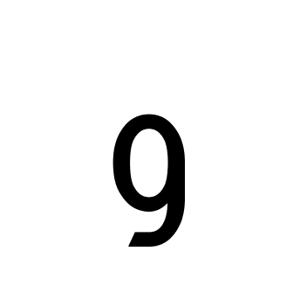

In [165]:
img_num = randint(0,len(files))
img = Image.open(data_folder+files[img_num])
img

In [182]:
letter = 'c'
data_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFonts_cropped/'+letter+'/'
files = os.listdir(data_folder)
img_num = randint(0,len(files))
img = Image.open(data_folder+files[img_num])

In [183]:
#img = img.convert('RGB')

In [5]:
img_data = totensor(img)

NameError: name 'totensor' is not defined

In [185]:
img_data = img_data[0]

In [186]:
img_data.shape

torch.Size([87, 300])

In [3]:
def letter_tight_crop(img_data,background=1):

    non_background_mask = img_data != background

    mask_max_values_w, mask_max_indices_w = torch.max(non_background_mask, dim=1)
    mask_max_values_h, mask_max_indices_h = torch.max(non_background_mask, dim=0)
    w_hit_indices = (mask_max_values_w == True).nonzero(as_tuple=True)[0]
    h_hit_indices = (mask_max_values_h == True).nonzero(as_tuple=True)[0]

    #get crop indices
    w_start = int(w_hit_indices[0])
    w_end = int(w_hit_indices[-1])
    h_start = int(h_hit_indices[0])
    h_end = int(h_hit_indices[-1])


    #padd narrower dim to make square aspect ratio
    diff = (w_end - w_start) - (h_end - h_start)

    try:
        if diff != 0:
            pad1 = int(diff/2)
            pad2 = int(diff/2)
            if diff%2 == 1:
                if (diff == 1) or (diff == -1):
                    pad2=diff
                else:
                    pad2 = pad2+int(pad2/abs(pad2))

            if pad2 > 0:
                h_end = h_end+pad2
                h_start = h_start-pad1
            else:
                w_end = w_end-pad2
                w_start = w_start+pad1
    except:
        import pdb; pdb.set_trace()
        
        
    #add some extra padding if padding exceeds orig image size
    try:
        if w_end > img_data.shape[0]:
            extra_pad = background*torch.ones(w_end - img_data.shape[0],img_data.shape[1])
            img_data = torch.cat((img_data, extra_pad), 0)
        if h_end > img_data.shape[1]:
            extra_pad = background*torch.ones(img_data.shape[0],h_end - img_data.shape[1])
            img_data = torch.cat((img_data, extra_pad), 1)
        if w_start < 0:
            extra_pad = background*torch.ones(-1*w_start,img_data.shape[1])
            img_data = torch.cat((extra_pad,img_data), 0)
            w_end -= w_start
            w_start = 0
        if h_start < 0:
            extra_pad = background*torch.ones(img_data.shape[0],-1*h_start)
            img_data = torch.cat((extra_pad,img_data), 1)
            h_end -= h_start
            h_start = 0
    except:
        import pdb; pdb.set_trace()

    
    #crop image
    cropped_img_data = img_data[w_start:w_end,h_start:h_end]
    
    if cropped_img_data.shape[0] != cropped_img_data.shape[1]:
        import pdb; pdb.set_trace()
    return cropped_img_data


In [10]:
#img = Image.open('../data/NISTByClass/a/train_a/train_61_07718.png')
img = Image.open('../data/googleFontsExtended/a/a_ABeeZee-Regular.jpg')

In [11]:
img_data = totensor(img)
img_data.shape

torch.Size([3, 300, 300])

In [ ]:
cropped_img_data = letter_tight_crop(img_data)

> <ipython-input-3-75630d088221>(63)letter_tight_crop()
     61 
     62     #crop image
---> 63     cropped_img_data = img_data[w_start:w_end,h_start:h_end]
     64 
     65     if cropped_img_data.shape[0] != cropped_img_data.shape[1]:



### Generate Cropped Data

In [284]:
root_root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/'

for letter in os.listdir(root_root+'googleFontsExtended/'):

    os.mkdir(root_root+'googleFonts_cropped/'+letter)
    print(letter)

    for file in os.listdir(root_root+'googleFontsExtended/'+letter):
        img = Image.open(root_root+'googleFontsExtended/'+letter+'/'+file)
        img_data = totensor(img)
        img_data = img_data[0]
        cropped_img_data = letter_tight_crop(img_data)
        cropped_img = topil(cropped_img_data)  
        cropped_img.save(root_root+'googleFonts_cropped/'+letter+'/'+file)
    

r
s
t
x
a
f
u
b
h
c
g
y
e
z
j
n
l
o
k
w
q
d
p
m
i
v


### Check first letters of file names

In [335]:
root_root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/'

for letter in os.listdir(root_root+'googleFonts_cropped/'):
    print(letter)
    for file in os.listdir(root_root+'googleFontsExtended/'+letter):
        if file[:2] != letter+'_':
            print(file)

r
s
t
x
a
f
u
b
h
c
g
y
e
z
j
n
l
o
k
w
q
d
p
m
i
v


### train test split

In [345]:
from random import shuffle

ratio = .8


root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFonts_cropped/'

letters = os.listdir(root)
os.mkdir(root+'train')
os.mkdir(root+'test')

for letter in letters:
    print(letter)
    files = os.listdir(root+letter)
    shuffle(files)
    last_train = int(len(files)*ratio)
    for i in range(len(files)):
        file = files[i]
        if i < last_train:
            target = 'train'
        else:
            target = 'test'
        call('cp %s/%s/%s %s/%s'%(root,letter,file,root,target),shell=True)
        
    





r
s
t
x
a
f
u
b
h
c
g
y
e
z
j
n
l
o
k
w
q
d
p
m
i
v


### dataloader augmentations

In [7]:
#get a random image
root= '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFonts_cropped/train/'

default_transform = transforms.Compose([
                    transforms.Resize((224,224)),
                    transforms.ToTensor()])

files = os.listdir(root)
img_num = randint(0,len(files))
img = Image.open(root+'/'+files[img_num])

img_data = default_transform(img)
img_data.shape


torch.Size([1, 224, 224])

In [856]:
from time import time

#get a random image
root= '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFonts_cropped/train/'


for i in range(1000):
    


    files = os.listdir(root)
    img_num = randint(0,len(files))
    img = Image.open(root+'/'+files[img_num])

    start = time()



    #PIL stuff


    shrink = random.uniform(.7,.15)
    shear = random.uniform(.5,1/.5)
    rot = random.uniform(-1,1)

    #img = img.resize((basewidth,hsize), Image.ANTIALIAS)
    print(shrink)
    print(shear)
    print(rot)

    #resize
    img = img.resize((224,224), Image.ANTIALIAS)

    s = (int(img.size[0]*shrink),int(img.size[1]*shrink*shear))
    small_img = img.resize(s, Image.ANTIALIAS)

    #rotate (might want 'expand' to be '1' if we notice letters getting cut off )
    small_img = small_img.rotate(30*rot, Image.BILINEAR, expand = 1, fillcolor='white')



    #center
    #x_anch = int(img.size[0]/2 - small_img.size[0]/2)
    #y_anch = int(img.size[1]/2 - small_img.size[1]/2)

    x_anch = random.randint(0,max(img.size[0]-small_img.size[0],0))
    y_anch = random.randint(0,max(img.size[1]-small_img.size[1],0))

    back_img = Image.new("L", img.size, 'white')
    back_img.paste(small_img, (x_anch, y_anch))

    #affined_img = back_img.convert('RGB')
    affined_img = back_img

    #tensor stuff


    class AddGaussianNoise(object):
        def __init__(self, mean=0., std=1.):
            self.std = std
            self.mean = mean

        def __call__(self, tensor):
            return tensor + torch.randn(tensor.size()) * self.std + self.mean

        def __repr__(self):
            return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)


    transform = transforms.Compose([
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                         std=[0.229, 0.224, 0.225]),
                                    AddGaussianNoise(0,.01)
                                    ])

    topil = transforms.ToPILImage()
    totensor = transforms.ToTensor()

    #img_data = transform(affined_img)
    img_data_r = totensor(affined_img)

    img_data_r[img_data_r>.5] = 1
    img_data_r[img_data_r<1] = 0

    img_data_g = deepcopy(img_data_r)
    img_data_b = deepcopy(img_data_r)

    affined_img




    to_close = True
    far_enough = .1

    while to_close:
        black_color = []
        white_color = []
        for c in range(3):
            black_color.append(random.uniform(0,1))
            white_color.append(random.uniform(.001,1))
        Sum = 0
        for c in range(3):
            Sum += (black_color[c]-white_color[c])**2
        color_d = np.sqrt(Sum)
        if color_d > far_enough:
            to_close = False





    img_data_r[img_data_r==1] = white_color[0]
    img_data_r[img_data_r==0] = black_color[0]

    img_data_g[img_data_g==1] = white_color[1]
    img_data_g[img_data_g==0] = black_color[1]

    img_data_b[img_data_b==1] = white_color[2]
    img_data_b[img_data_b==0] = black_color[2]

    #print(white_color)
    #print(black_color)


    img_data = torch.cat((img_data_r,img_data_g,img_data_b))

    #print(img_data.shape)

    img_data = transform(img_data)

    img_out = topil(img_data)

    #print(time() - start)


    img_out.save('/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/sample_augmentations/'+files[img_num].replace('.jpg','_'+str(round(time(),5))+'.jpg'))


0.298935200064121
0.9653669697857087
0.8810721346442545
0.6365138084438136
0.8868365306686851
0.07837909312428426
0.46432800672074187
1.6800929046830069
0.2282057158578077
0.6656143370788234
1.2907667630928406
-0.7020087939758493
0.2548441332023651
1.1031019962034578
-0.6486900791060146
0.2108022144234155
1.2396178029325433
-0.46671737431222127
0.3716484546813811
1.352147842328109
-0.9829268052340403
0.4279308181273958
1.772661792541235
-0.2929208180471272
0.5847885011471544
1.6743905991542785
0.37248293088270024
0.45895186500720675
0.5867768357937164
0.6649215308669465
0.6775173713429169
1.9536116242162032
-0.5027534235334832
0.6973225243620301
1.3175152865371067
0.9094615534326567
0.6438623413569595
1.191928420601596
0.9052481674570463
0.44317412155391467
1.9150090080688353
-0.1755334893185958
0.5992375556686975
0.9084025670639967
0.9456173831741161
0.23367106411090194
0.5297568564218164
-0.6221712422726642
0.2329465215708889
1.8678530684076113
-0.15380011863980836
0.3159087850615367

0.3162402686341353
1.83416277957962
0.4824172299623606
0.5564295115363264
1.2860127469058338
0.3853671497926576
0.5228724143902217
1.5025783141925577
0.16295179411469918
0.3637627528351784
1.3342119244322515
-0.46193492092829924
0.6146561898663527
0.993675822999891
0.23318984973087797
0.39484311325424115
1.894426767602992
0.7438930407124837
0.2253834618677793
1.0382821330388026
0.9660183297358835
0.34223368015704264
1.8750123357056319
0.40587192432489005
0.6597388575689559
1.9110957277531582
-0.7210790456467413
0.6419096980939245
1.2529100955992927
-0.6917615834080413
0.2105785012249909
1.6831846810208624
0.9731480168593549
0.41822009074392114
1.4653805468220338
-0.7656799826296703
0.20828528860193313
0.69800218022784
-0.23627397752078672
0.6346410599372442
1.0396784656751457
-0.8179669623162176
0.24983584852762764
0.9415379147158313
0.30438905444465547
0.234195306077136
0.7265203476230253
-0.7366299961240987
0.16957912947049325
1.0231616534163765
0.9168357442561657
0.5801983695431087


0.27553561585390013
1.3565211199291873
0.982685136472188
0.6778156321296926
1.736552886922099
-0.3734954928476426
0.47474610922638494
0.5250352768711225
0.9815055996106838
0.31151060507742806
0.8714732920878995
0.46863207469445434
0.20219704189055882
1.0858193262006721
-0.25646732301782493
0.5937694385734484
1.7688934027800751
-0.9003104405328894
0.5917726102859896
0.8524143401982697
-0.09024660532366258
0.37583744299896144
0.837260454997326
0.12085150396399169
0.3898961099233658
1.878011062612682
-0.961390171696908
0.2514873983199917
0.5983050462498174
0.8453794643111061
0.1637761040431478
1.1928780318734364
-0.2090301188470396
0.4345728455490745
0.8264662623195816
-0.3988642641034199
0.4650241548226741
1.3272425197401208
-0.1601666011683911
0.6036049915746611
0.5201046776227025
0.3029829108561535
0.2606439141333832
1.2260494983964476
0.21158604097197276
0.30111978942262474
0.5491829997007651
0.4404419516766742
0.17117052613136896
0.9227289476624636
0.824015266300874
0.518117658409901

0.28692885972699506
1.6400830159026885
0.07754330539154841
0.2820299971969613
1.8574351574608003
0.18222449847840494
0.2066536420495581
1.5994475037306368
-0.39663683360449276
0.22863825862992537
0.5807513616080271
-0.8011979793902697
0.6002076938951573
0.6187701769587126
-0.16071861784301822
0.615761595879207
1.557367729626725
-0.6221799297261479
0.6418579688999599
1.3419404659276504
-0.532816254521236
0.16724944838759748
1.3327487851355069
-0.06269017867883853
0.6112959094755434
1.504962148912226
-0.6955082050743853
0.6994892461035153
1.941600974508398
0.20029829335975657
0.24013212006326473
1.4598335935721403
-0.49724560141461427
0.2443644879106595
0.9845253788555535
0.46246071122942345
0.5354728929795636
1.7812875712041798
-0.4935990318257606
0.6844141734580061
1.703789516017504
-0.23839350213469035
0.6805767933694205
1.6545736346770143
-0.5016724097695575
0.5861742194109325
0.9721352770034124
0.5199340499666782
0.24925436269338258
1.9295665328901344
-0.9964352597513291
0.632065560

0.1505643309837169
0.5512206893728149
0.10590666861928733
0.39394030127995977
0.6339529388942267
0.21044292151284116
0.5798444497004216
1.9732939236502416
0.5251202230965493
0.3981667826155209
1.470701604281333
-0.2701076696849736
0.1564853674856017
1.8839413078471177
-0.6762417369720812
0.27938069312955693
1.340113164505537
0.03631882810005771
0.17778609217369978
1.4688982719931811
0.42453176120208225
0.4923833887422444
0.6831139010637742
0.5141967107000205
0.5106788017917294
0.5204161116531244
0.5370433552582943
0.36569177094944555
1.6197897026988624
-0.8170160416820336
0.3485183447389029
0.5763586126358553
-0.009676388241205647
0.19485910433485332
0.8792482267939976
-0.004906908725783143
0.49572671901267823
0.6007973955025356
0.37531012291400034
0.38963858093644743
0.6078171761846697
0.617029971851079
0.15630725068065354
1.4540022130679724
0.052240470138068984
0.6836341131931977
1.817408406460419
0.004382429134448751
0.42854359780515217
1.252270119818974
0.5126428578312152
0.6594052

0.19651010494243815
1.6587371426926603
0.8538767721243314
0.2378630821001107
0.5268818556384902
0.6449396531358969
0.5747409377884173
1.7988470308412707
-0.8143541948218662
0.28832219929341163
1.9762103774767694
-0.36390441126372797
0.31497472089201406
1.3182848906351263
-0.8776857955013395
0.46301410279567023
1.9472130157936065
0.19346807907097174
0.26924839635224435
1.7037201997309457
0.682830650370289
0.4287949619165053
0.9176438515226428
-0.40037608366522015
0.3979395644250394
0.6642192964033351
-0.2588846348266427
0.6079661489935981
1.4013674034626187
-0.7093883704960315
0.5988827056484692
0.6282515581043036
-0.7754623520476491
0.19542417664564649
0.5535565103299063
-0.6139905029518993
0.5511904102844692
0.8200067467468146
-0.06847163336724127
0.17586308805491524
0.8857320141830194
-0.027649654752005537
0.532603549172329
1.6222422274143797
-0.08347208180569665
0.27143390675732587
1.6437950395616423
0.006033861796071793
0.6890917842098105
1.63871253692145
-0.6513704261938298
0.6080

0.21554700193515208
0.918074074803918
-0.5606323746576896
0.2505945344826572
0.5793877934363563
-0.6592422134502325
0.493437908016514
0.980626486542665
-0.5004672798628627
0.23707283768750298
0.7818186014165103
0.5062651936951195
0.39214594149697596
1.087660726607829
-0.7928263479613029
0.44417623425616287
1.5561314490763414
-0.7803980679819518
0.23215542066957673
1.7523388145193868
0.550968695568838
0.5691886838692639
1.5798188315832062
0.3258202983884675
0.6568227847251465
0.7753367261340594
-0.01513960725129726
0.39000650660130015
1.550952972075309
-0.8106453714120729
0.21177603854747878
0.8726029227237111
0.6953278944041399
0.557201565689285
1.4603756653619264
-0.3621248755744748
0.4406912601709196
1.0767429429969095
-0.7521590287382913
0.2530333558463981
0.5424769603969606
-0.2911287618598766
0.20666545100450107
0.8786253555993533
0.4119213604936036
0.2534626485860166
0.6403004535878235
0.5460408260669507
0.6588877188904374
0.5311175753341351
0.47792694407188274
0.4139893928692734

## NIST

### move pngs to jpgs

In [7]:
import os

root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/NISTByClass/'
for letter in os.listdir(root):
    if not os.path.isdir(os.path.join(root,letter)):
        continue
    for block in os.listdir(os.path.join(root,letter)):
        if not os.path.isdir(os.path.join(root,letter,block)):
            continue
        for file in os.listdir(os.path.join(root,letter,block)):
            if 'png' in file:
                #print(os.path.join(root,letter,block,file))
                img = Image.open(os.path.join(root,letter,block,file))
                newname = letter+'_NIST'+file.replace('hsf_4','').replace('png','jpg')
                img.save(os.path.join(root,letter,block,newname))

### crop mnist images

In [10]:
import random
totensor = transforms.ToTensor()

root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/NISTByClass/'
out_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/combined_data/'
for letter in os.listdir(root):
    print(letter)
    if not os.path.isdir(os.path.join(root,letter)):
        continue
    for block in os.listdir(os.path.join(root,letter)):
        if not os.path.isdir(os.path.join(root,letter,block)):
            continue
        for file in os.listdir(os.path.join(root,letter,block)):
            if 'jpg' in file:
                img = Image.open(os.path.join(root,letter,block,file))
                img_data = totensor(img)
                img_data = img_data[0]
                cropped_img_data = letter_tight_crop(img_data)
                cropped_img = topil(cropped_img_data) 
                if 'test' in block:
                    out_block = 'test'
                elif 'train' in block:
                    out_block = 'train'
                else:
                    raise Exception('block %s?'%block)
                    
                cropped_img.save(os.path.join(out_folder,out_block,file))



r
s
t
x
a
f
u
b
h
c
g
y
.DS_Store
e
z
j
n
l
o
k
w
q
d
p
m
i
v


8
0.4413544025862615
0.6809758545496334
0.28383013781400723


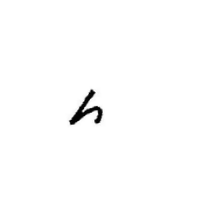

In [422]:
import random

root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/NISTByClass/'
topil = transforms.ToPILImage()
totensor = transforms.ToTensor()

# for letter in os.listdir(root):
#     for file in os.listdir(os.path.join(root,letter)):
#         img = Image.open(root_root+'googleFontsExtended/'+letter+'/'+file)
#         img_data = totensor(img)
#         img_data = img_data[0]
#         cropped_img_data = letter_tight_crop(img_data)
#         cropped_img = topil(cropped_img_data)  
#         cropped_img.save(root_root+'googleFonts_cropped/'+letter+'/'+file)




letters = os.listdir(root)
letters.remove('.DS_Store')
letter_int = random.randint(0,len(letters)-1)
print(letter_int)
letter = letters[letter_int]
block = 'train_'+letter
files = os.listdir(os.path.join(root,letter,block))
file = files[random.randint(0,len(files))]


#load image
img = Image.open(os.path.join(root,letter,block,file))
img_data = totensor(img)
img_data = img_data[0]

#crop image
cropped_img_data = letter_tight_crop(img_data)
cropped_img = topil(cropped_img_data)  
cropped_img






#PIL stuff

color = False
shrink = random.uniform(.9,.25)
shear = random.uniform(.5,1/.5)
rot = random.uniform(-.5,.5)

#img = img.resize((basewidth,hsize), Image.ANTIALIAS)
print(shrink)
print(shear)
print(rot)

#resize
img = img.resize((224,224), Image.ANTIALIAS)

s = (int(img.size[0]*shrink),int(img.size[1]*shrink*shear))
small_img = img.resize(s, Image.ANTIALIAS)

#rotate (might want 'expand' to be '1' if we notice letters getting cut off )
small_img = small_img.rotate(30*rot, Image.BILINEAR, expand = 1, fillcolor='white')



#center
#x_anch = int(img.size[0]/2 - small_img.size[0]/2)
#y_anch = int(img.size[1]/2 - small_img.size[1]/2)

x_anch = random.randint(0,max(img.size[0]-small_img.size[0],0))
y_anch = random.randint(0,max(img.size[1]-small_img.size[1],0))

back_img = Image.new("L", img.size, 'white')
back_img.paste(small_img, (x_anch, y_anch))

#affined_img = back_img.convert('RGB')
affined_img = back_img

#tensor stuff


class AddGaussianNoise(object):
    def __init__(self, mean=0., std=1.):
        self.std = std
        self.mean = mean

    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)


transform = transforms.Compose([
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                     std=[0.229, 0.224, 0.225]),
                                AddGaussianNoise(0,.01)
                                ])

topil = transforms.ToPILImage()
totensor = transforms.ToTensor()



#img_data = transform(affined_img)
if color:
    img_data_r = totensor(affined_img)

    img_data_r[img_data_r>.5] = 1
    img_data_r[img_data_r<1] = 0

    img_data_g = deepcopy(img_data_r)
    img_data_b = deepcopy(img_data_r)

    affined_img




    to_close = True
    far_enough = .4

    while to_close:
        black_color = []
        white_color = []
        for c in range(3):
            black_color.append(random.uniform(0,1))
            white_color.append(random.uniform(.001,1))
        Sum = 0
        for c in range(3):
            Sum += (black_color[c]-white_color[c])**2
        color_d = np.sqrt(Sum)
        if color_d > far_enough:
            to_close = False





    img_data_r[img_data_r==1] = white_color[0]
    img_data_r[img_data_r==0] = black_color[0]

    img_data_g[img_data_g==1] = white_color[1]
    img_data_g[img_data_g==0] = black_color[1]

    img_data_b[img_data_b==1] = white_color[2]
    img_data_b[img_data_b==0] = black_color[2]

    #print(white_color)
    #print(black_color)


    img_data = torch.cat((img_data_r,img_data_g,img_data_b))
    img_data = transform(img_data)
    
else:
    img_data = totensor(affined_img)
    img_data = torch.cat((img_data,img_data,img_data))
    
#print(img_data.shape)



img_out = topil(img_data)

#print(time() - start)


img_out

### Failed augementations

0.24481875871872188
0.9907120900615795
0.9575112587237766
0.5484199491628774
[[0.24481876 0.        ]
 [0.         0.24481876]]
(402, 402)


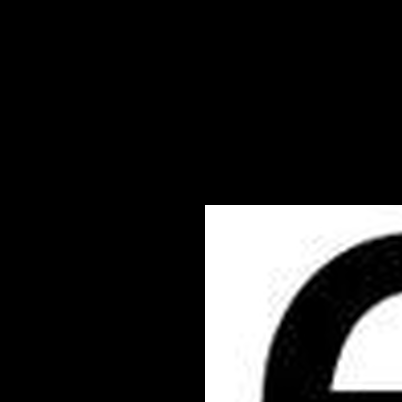

In [71]:
#shrink and translational shift 
import random
# shear
shrink = random.uniform(.2,.5)
shear1 = random.uniform(.8,1)
shear2 = random.uniform(.8,1)
rot = random.uniform(-1,1)

shrink_mat = np.array([[shrink,0],
                       [0,shrink]])
shear1_mat = np.array([[1,shear1],
                       [0,    1]])

shear2_mat = np.array([[1,     0],
                       [shear2,1]])

rot_mat =    np.array([[np.cos(rot),-np.sin(rot)],
                       [np.sin(rot),np.cos(rot)]])

tran_mat = np.dot(np.dot(np.dot(shrink_mat,rot_mat),shear1_mat),shear2_mat)
tran_mat = shrink_mat

print(shrink)
print(shear1)
print(shear2)
print(rot)

print(tran_mat)


import numpy as np
from PIL import Image
from scipy import ndimage

#img = img.convert('RGB')

array = np.array(img)

#height, width, colors = array.shape

height, width = array.shape



transform = [[float(tran_mat[0,0]), float(tran_mat[0,1]), 0],
             [float(tran_mat[1,0]), float(tran_mat[1,1]), 0],
             [0,0,1]]


sheared_array = ndimage.affine_transform(array,
                                         tran_mat,
                                         offset=(-50, -50),
                                         #output_shape=(height+200, width+200, colors),
                                         output_shape=(height+300, width+300),
                                         cval=0)

print(sheared_array.shape)
img_out = Image.fromarray(sheared_array)
img_out



In [14]:
a = np.array([[1,2],
              [0,1]])

b = np.array([[1,0],
              [2,1]])

np.dot(a,b)

array([[5, 2],
       [2, 1]])

(335, 335)


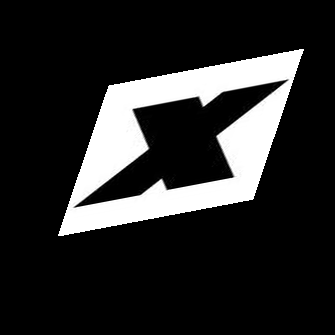

In [6]:
import numpy as np
from PIL import Image
from scipy import ndimage
import random

#img = img.convert('RGB')

array = np.array(img)

#height, width, colors = array.shape

height, width = array.shape

shrink = .5


a = random.uniform(-.3,.3)
b = random.uniform(-.3,.3)
c = random.uniform(-.3,.3)
d = random.uniform(-.3,.3)
tx=-100
ty=-100
transform = [[1+a, b, tx],
             [c, 1+d, ty],
             [0,0,1]]
sheared_array = ndimage.affine_transform(array,
                                         transform,
                                         offset=(-100, -100),
                                         #output_shape=(height+200, width+200, colors),
                                         output_shape=(height+200, width+200),
                                         cval=0)

print(sheared_array.shape)
img_out = Image.fromarray(sheared_array)
img_out

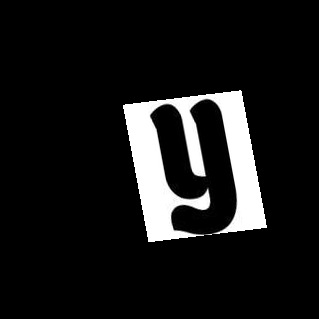

In [483]:
img_out

In [1]:
# Copyright 2020 The lucent_edited Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

from __future__ import absolute_import, division, print_function

import torch
import torch.nn.functional as F
from torchvision.transforms import Normalize
import numpy as np
import kornia
from kornia.geometry.transform import translate


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


def jitter(d):
    assert d > 1, "Jitter parameter d must be more than 1, currently {}".format(d)

    def inner(image_t):
        dx = np.random.choice(d)
        dy = np.random.choice(d)
        return translate(image_t, torch.tensor([[dx, dy]]).float().to(device))

    return inner


def pad(w, mode="reflect", constant_value=0.5):
    if mode != "constant":
        constant_value = 0

    def inner(image_t):
        return F.pad(image_t, [w] * 4, mode=mode, value=constant_value,)

    return inner


def random_scale(scales):
    def inner(image_t):
        scale = np.random.choice(scales)
        shp = image_t.shape[2:]
        scale_shape = [_roundup(scale * d) for d in shp]
        pad_x = max(0, _roundup((shp[1] - scale_shape[1]) / 2))
        pad_y = max(0, _roundup((shp[0] - scale_shape[0]) / 2))
        upsample = torch.nn.Upsample(
            size=scale_shape, mode="bilinear", align_corners=True
        )
        return F.pad(upsample(image_t), [pad_y, pad_x] * 2)

    return inner


def random_rotate(angles, units="degrees"):
    def inner(image_t):
        b, _, h, w = image_t.shape
        # kornia takes degrees
        alpha = _rads2angle(np.random.choice(angles), units)
        angle = torch.ones(b) * alpha
        scale = torch.ones(b)
        center = torch.ones(b, 2)
        center[..., 0] = (image_t.shape[3] - 1) / 2
        center[..., 1] = (image_t.shape[2] - 1) / 2
        M = kornia.get_rotation_matrix2d(center, angle, scale).to(device)
        rotated_image = kornia.warp_affine(image_t.float(), M, dsize=(h, w))
        return rotated_image

    return inner



def scale(scale):
    def inner(image_t):
        shp = image_t.shape[2:]
        scale_shape = [_roundup(scale * d) for d in shp]
        pad_x = max(0, _roundup((shp[1] - scale_shape[1]) / 2))
        pad_y = max(0, _roundup((shp[0] - scale_shape[0]) / 2))
        upsample = torch.nn.Upsample(
            size=scale_shape, mode="bilinear", align_corners=True
        )
        return F.pad(upsample(image_t), [pad_y, pad_x] * 2)

    return inner


def rotate(angle, units="degrees"):
    def inner(image_t):
        b, _, h, w = image_t.shape
        # kornia takes degrees
        alpha = _rads2angle(angle, units)
        angle = torch.ones(b) * alpha
        scale = torch.ones(b)
        center = torch.ones(b, 2)
        center[..., 0] = (image_t.shape[3] - 1) / 2
        center[..., 1] = (image_t.shape[2] - 1) / 2
        M = kornia.get_rotation_matrix2d(center, angle, scale).to(device)
        rotated_image = kornia.warp_affine(image_t.float(), M, dsize=(h, w))
        return rotated_image

    return inner



def compose(transforms):
    def inner(x):
        for transform in transforms:
            x = transform(x)
        return x

    return inner


def _roundup(value):
    return np.ceil(value).astype(int)


def _rads2angle(angle, units):
    if units.lower() == "degrees":
        return angle
    if units.lower() in ["radians", "rads", "rad"]:
        angle = angle * 180.0 / np.pi
    return angle


def normalize():
    # ImageNet normalization for torchvision models
    # see https://pytorch.org/docs/stable/torchvision/models.html
    normal = Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

    def inner(image_t):
        return torch.stack([normal(t) for t in image_t])

    return inner


def preprocess_inceptionv1():
    # Original Tensorflow's InceptionV1 model
    # takes in [-117, 138]
    # See https://github.com/tensorflow/lucid/blob/master/lucid/modelzoo/other_models/InceptionV1.py#L56
    # Thanks to ProGamerGov for this!
    return lambda x: x * 255 - 117


standard_transforms = [
    pad(12, mode="constant", constant_value=0.5),
    jitter(8),
    random_scale([1 + (i - 5) / 50.0 for i in range(11)]),
    random_rotate(list(range(-10, 11)) + 5 * [0]),
    jitter(4),
]


In [4]:
tran = compose(standard_transforms)

In [10]:
img_data = img_data.to('cuda:0')
tran(img_data)

IndexError: tuple index out of range

# random checks

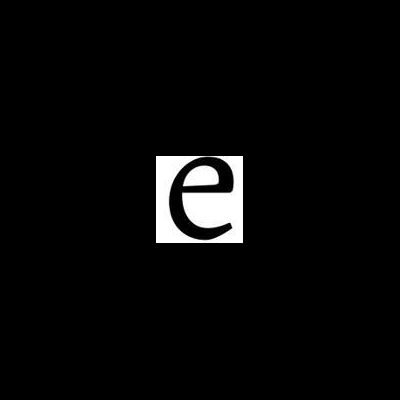

In [333]:
root= '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFonts_cropped/'
letters = os.listdir(root)
let_num = randint(0,len(letters))
files = os.listdir(root+'/'+letters[let_num])
img_num = randint(0,len(files))
img = Image.open(root+'/'+letters[let_num]+'/'+files[img_num])


old_size = img.size

new_size = (400, 400)
new_im = Image.new("RGB", new_size)   ## luckily, this is already black!
new_im.paste(img, ((new_size[0]-old_size[0])//2,
                      (new_size[1]-old_size[1])//2))


new_im


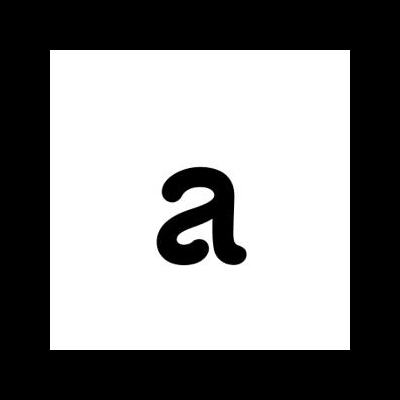

In [329]:
root= '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFontsExtended/'
letters = os.listdir(root)
let_num = randint(0,len(letters))
files = os.listdir(root+'/'+letters[let_num])
img_num = randint(0,len(files))
img = Image.open(root+'/'+letters[let_num]+'/'+files[img_num])


old_size = img.size

new_size = (400, 400)
new_im = Image.new("RGB", new_size)   ## luckily, this is already black!
new_im.paste(img, ((new_size[0]-old_size[0])//2,
                      (new_size[1]-old_size[1])//2))


new_im

In [240]:
non_background_mask = img_data != background

mask_max_values_w, mask_max_indices_w = torch.max(non_background_mask, dim=1)
mask_max_values_h, mask_max_indices_h = torch.max(non_background_mask, dim=0)
w_hit_indices = (mask_max_values_w == True).nonzero(as_tuple=True)[0]
h_hit_indices = (mask_max_values_h == True).nonzero(as_tuple=True)[0]

#get crop indices
w_start = int(w_hit_indices[0])
w_end = int(w_hit_indices[-1])
h_start = int(h_hit_indices[0])
h_end = int(h_hit_indices[-1])


#padd narrower to make square aspect ratio
diff = (w_end - w_start) - (h_end - h_start)


In [241]:

pad1 = int(diff/2)
pad2 = int(diff/2)
if diff%2 == 1:
    if (diff == 1) or (diff == -1):
        pad2=diff
    else:
        pad2 = pad2+int(pad2/abs(pad2))




#crop image
#cropped_img_data = img_data[w_start:w_end,h_start:h_end]

In [229]:
pad1

-28

In [242]:
if pad2 > 0:
    h_end = h_end+pad2
    h_start = h_start-pad1
else:
    print('here')
    w_end = w_end-pad2
    w_start = w_start+pad1

here


In [237]:
cropped_img_data = img_data[w_start:w_end,h_start:h_end]

183

In [253]:
if w_end > img_data.shape[0]:
    extra_pad = background*torch.ones(w_end - img_data.shape[0],img_data.shape[1])
    img_data = torch.cat((img_data, extra_pad), 0)
if h_end > img_data.shape[1]:
    extra_pad = background*torch.ones(h_end - img_data.shape[1],img_data.shape[0])
    img_data = torch.cat((img_data, extra_pad), 1)
if w_start < 0:
    extra_pad = background*torch.ones(-1*w_start,img_data.shape[1])
    img_data = torch.cat((extra_pad,img_data), 0)
if h_start < 0:
    extra_pad = background*torch.ones(-1*h_start,img_data.shape[0])
    img_data = torch.cat((extra_pad,img_data), 1)
    
    


torch.Size([315, 300])

In [254]:
cropped_img_data = img_data[w_start:w_end,h_start:h_end]

In [258]:
5*torch.ones(2,3)

tensor([[5., 5., 5.],
        [5., 5., 5.]])

In [249]:
extra_pad.shape

torch.Size([15, 300])

In [235]:
cropped_img_data = img_data[w_start:w_end,h_start:h_end]

In [236]:
cropped_img_data.shape

torch.Size([168, 183])

In [227]:
h_end - h_start

183

In [222]:
pad2

-28

In [171]:
topil = transforms.ToPILImage()
totensor = transforms.ToTensor()
cropped_img = topil(cropped_img_data)

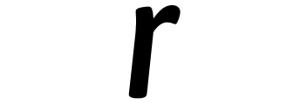

In [174]:
cropped_img

In [58]:
print ((mask_max_values_w == True).nonzero(as_tuple=True)[0][-1])


tensor(179)


In [56]:
mask_max_values_w.shape

torch.Size([224])

In [91]:
x = -7
int(x/abs(x))

-1

In [85]:
first_nonbackground.shape

torch.Size([224])

In [36]:
mask_max_values, mask_max_indices = torch.max(non_background_mask, dim=1)

In [40]:
mask_max_indices.shape

torch.Size([224])

In [ ]:
for letter in os.listdir('/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFontsExtended/'):
    print(letter)
    if letter[0:2] == '._':
        call('rm /mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFontsExtended/%s'%(letter),shell=True)
    else:
        for file in os.listdir('/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFontsExtended/'+letter+'/'):
            if file[0:2] == '._':
                call('rm /mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFontsExtended/%s/%s'%(letter,file),shell=True)

r
._e
s


In [2]:
data_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/googleFontsExtended/'

In [ ]:
for letter in os.listdir(data_folder):
    if letter[0] == '.':
        continue
    for file in os.listdir(data_folder+'/'+letter+'/'):
        if file[0] == '\'':
            print(file)

### MNIST RESIZE

In [857]:
mnist = torch.load('/mnt/data/chris/dropbox/Research-Hamblin/Projects/cnn_letter_rsa/augmentation_refactor/data/test_letters.pt')

In [862]:
torch.min(mnist[1])

tensor(1)

In [863]:
letters=['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z']

16997
a


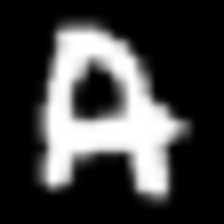

In [987]:
i  = random.randint(0,len(mnist[0]))

print(i)
i=92
img = topil(torch.transpose(mnist[0][i],1,0))
let_i = letters[int(mnist[1][i])-1]

print(let_i)
img = img.resize((224,224))
img

In [978]:
for i in range(100):
    let_i = letters[int(mnist[1][i])-1]
    print(let_i)

a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a
a


In [872]:


print(letters)
img

['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']


### Sample augs from data loader class

In [2]:
import data_classes

In [11]:
batch_size = 64

train_loader = torch.utils.data.DataLoader(
                        data_classes.augmentation_letters_data(
                                                               imagenet_normalize=False,
                                                               return_augmentations=True,
                                                               transform_prob_dict = {'color':.7,
                                                                                      'size':.7,
                                                                                      'noise':.7
                                                                                        }
                                                              ),
                        batch_size=batch_size, shuffle=True)

In [12]:
for batch_idx, (data,target,augmentations) in enumerate(train_loader):

    break

In [13]:
augmentations

[tensor([1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0,
         1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1,
         1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1]),
 tensor([1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
         1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0,
         1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0]),
 tensor([1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
         1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1,
         1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1])]

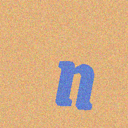

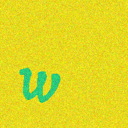

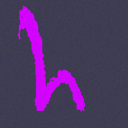

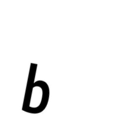

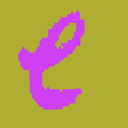

...

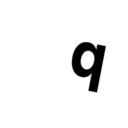

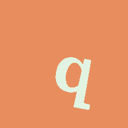

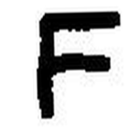

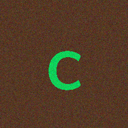

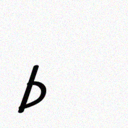

In [14]:
for i in range(batch_size):
    #print(data[i])
    img_array = np.transpose(np.clip(data[i].detach().numpy(),0,1),(1,2,0))*255
    #img_array =data[0].detach().numpy() * 255
    img_array = img_array.astype(np.uint8)

    #print(img_array)
    img = Image.fromarray(img_array)
    img = img.resize((128,128))

    display(img)

### Scene background letters

In [1]:
from data_classes import *


In [ ]:
class scene_letters_data(Dataset):

    def __init__(self, root_dir ='../data/combined_data/train_uncropped/',scene_dir = '../data/letterBG_SUN/'use_augment=True, imagenet_normalize=True,return_augmentations = False, cropped=False, transform_prob_dict=None):

        self.root_dir = root_dir

        self.img_names = os.listdir(self.root_dir)
        self.img_names.sort()

        self.label_names = []
        for img_name in self.img_names:
            label_name = img_name.split('_')[0]
            if label_name not in self.label_names:
                self.label_names.append(label_name)

        self.num_classes = len(self.label_names)

        self.cropped = cropped

        self.shrink = {'font':random.uniform(.6,.2),'NIST':random.uniform(.9,.35)}
        self.shear = {'font':random.uniform(.7,1/.7),'NIST':random.uniform(.7,1/.7)}
        self.rot = {'font':random.uniform(-.6,.6),'NIST':random.uniform(-.1,.1)}

        self.use_augment = use_augment
        self.imagenet_normalize = imagenet_normalize

        self.return_augmentations = return_augmentations

        if transform_prob_dict is None:
            self.transform_prob_dict = {'color':.5,
                                        'size':.5,
                                        'noise':.5
                                        }
        else:
            self.transform_prob_dict = transform_prob_dict

    def __len__(self):
        return len(self.img_names)

    def get_label_from_name(self,img_name):
        label_name = img_name.split('_')[0]
        return torch.tensor(self.label_names.index(label_name))       

    def augment(self,img,img_path):
        augmentations = [0,0,0]

        img = img.resize((224,224), Image.ANTIALIAS)

        if 'NIST' in img_path:
            shrink,shear,rot = self.shrink['NIST'],self.shear['NIST'],self.rot['NIST']
        else:
            shrink,shear,rot = self.shrink['font'],self.shear['font'],self.rot['font']

        if np.random.binomial(1,self.transform_prob_dict['size']) == 1:
            augmentations[0] = 1

            if not self.cropped:
                img_data = totensor(img)
                cropped_img_data = letter_tight_crop(img_data)
                img = topil(cropped_img_data)
                img = img.resize((224,224), Image.ANTIALIAS)

            s = (int(img.size[0]*shrink),int(img.size[1]*shrink*shear))

            small_img = img.resize(s, Image.ANTIALIAS)

            #rotate (might want 'expand' to be '1' if we notice letters getting cut off )
            small_img = small_img.rotate(30*rot, Image.BILINEAR, expand = 1, fillcolor='white')

            #center
            #x_anch = int(img.size[0]/2 - small_img.size[0]/2)
            #y_anch = int(img.size[1]/2 - small_img.size[1]/2)

            x_anch = random.randint(0,max(img.size[0]-small_img.size[0],0))
            y_anch = random.randint(0,max(img.size[1]-small_img.size[1],0))

            back_img = Image.new("L", img.size, 'white')
            back_img.paste(small_img, (x_anch, y_anch))
            #affined_img = back_img.convert('RGB')
            affined_img = back_img
        else:
            if self.cropped:
                img = add_img_ratio_margin(img)
            affined_img = img.resize((224,224), Image.ANTIALIAS)
            affined_img = affined_img.convert('L')

        #tensor stuff


        #img_data = transform(affined_img)
        if np.random.binomial(1,self.transform_prob_dict['color']) == 1:
            augmentations[1] = 1
            img_data_r = totensor(affined_img)

            img_data_r[img_data_r>.5] = 1
            img_data_r[img_data_r<1] = 0

            img_data_g = deepcopy(img_data_r)
            img_data_b = deepcopy(img_data_r)

            affined_img




            to_close = True
            far_enough = .4

            while to_close:
                black_color = []
                white_color = []
                for c in range(3):
                    black_color.append(random.uniform(0,1))
                    white_color.append(random.uniform(.001,1))
                Sum = 0
                for c in range(3):
                    Sum += (black_color[c]-white_color[c])**2
                color_d = np.sqrt(Sum)
                if color_d > far_enough:
                    to_close = False

            img_data_r[img_data_r==1] = white_color[0]
            img_data_r[img_data_r==0] = black_color[0]

            img_data_g[img_data_g==1] = white_color[1]
            img_data_g[img_data_g==0] = black_color[1]

            img_data_b[img_data_b==1] = white_color[2]
            img_data_b[img_data_b==0] = black_color[2]

            img_data = torch.cat((img_data_r,img_data_g,img_data_b))


        else:
            img_data = totensor(affined_img)
            img_data = torch.cat((img_data,img_data,img_data))

        if np.random.binomial(1,self.transform_prob_dict['noise']) == 1:
            noise_amount = np.random.uniform(0.01,.1)
            augmentation_transform = transforms.Compose([
                                                        AddGaussianNoise(0,noise_amount)
                                                        ])

            augmentations[2] = 1
            img_data = augmentation_transform(img_data)


        return img_data,augmentations


    def __getitem__(self, idx):
        #import pdb;pdb.set_trace()
        img_path = os.path.join(self.root_dir,self.img_names[idx])
        img = Image.open(img_path)

        if self.use_augment:
            img, augmentations = self.augment(img,img_path)
            if self.imagenet_normalize:
                img = imnet_normalize(img)


        else:
            img = img.convert('RGB')
            if self.imagenet_normalize:
                img = mixed_letter_transform(img)
            else:
                img = default_transform(img)

        label = self.get_label_from_name(self.img_names[idx])

        if self.return_augmentations:
            return (img,label,augmentations)
        else:
            return (img,label)





In [3]:
import torch

batch_size = 64

train_loader = torch.utils.data.DataLoader(
                        data_classes.augmentation_letters_data(
                                                               imagenet_normalize=False,
                                                               return_augmentations=True,
                                                               transform_prob_dict = {'color':.7,
                                                                                      'size':.7,
                                                                                      'noise':.7
                                                                                        }
                                                              ),
                        batch_size=batch_size, shuffle=True)

In [4]:
for batch_idx, (data,target,augmentations) in enumerate(train_loader):

    break

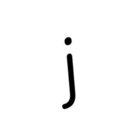

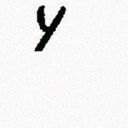

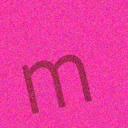

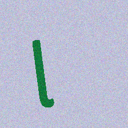

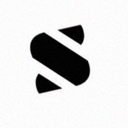

...

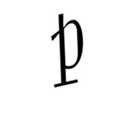

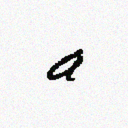

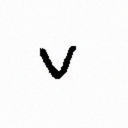

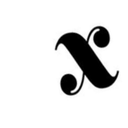

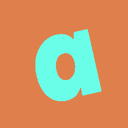

In [7]:
import numpy as np
from PIL import Image, ImageOps

for i in range(batch_size):
    #print(data[i])
    img_array = np.transpose(np.clip(data[i].detach().numpy(),0,1),(1,2,0))*255
    #img_array =data[0].detach().numpy() * 255
    img_array = img_array.astype(np.uint8)

    #print(img_array)
    img = Image.fromarray(img_array)
    img = img.resize((128,128))

    display(img)

In [3]:
import numpy as np
condition = [False, True, False]
array1 = [1, 1, 1]
array2 = [2, 2, 3]
print(np.where(condition, array1, array2))




[2 1 3]


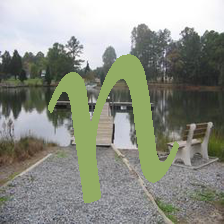

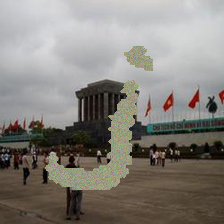

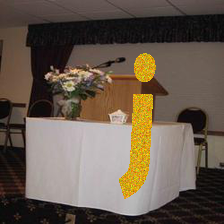

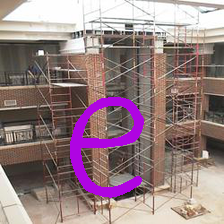

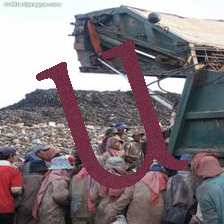

...

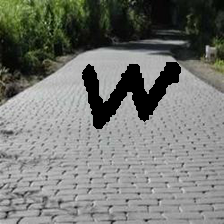

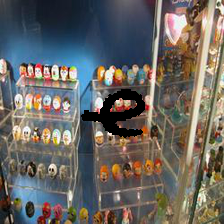

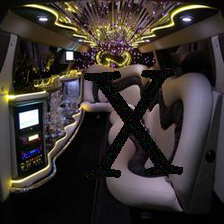

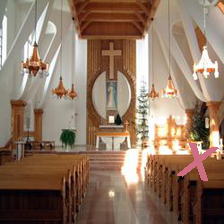

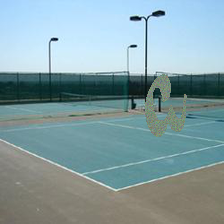

In [2]:
import os
from PIL import Image,ImageOps
import random
import numpy as np

letter_dir = '../data/combined_data/train_uncropped/'
scene_dir = '../data/letterBG_SUN/'
letter_img_names = os.listdir(letter_dir)
scene_img_names = os.listdir(scene_dir)


for a in range(100):


    let_i = random.randint(0,len(letter_img_names))
    scene_i = random.randint(0,len(scene_img_names))

    letter_path = os.path.join(letter_dir,letter_img_names[let_i])
    scene_path = os.path.join(scene_dir,scene_img_names[scene_i])




    img = Image.open(letter_path)
    #display(img)
    scene_img = Image.open(scene_path)
    scene_img = scene_img.resize((224,224), Image.ANTIALIAS)
    #display(scene_img)




    shrink = {'font':random.uniform(.6,.2),'NIST':random.uniform(.9,.35)}
    shear = {'font':random.uniform(.7,1/.7),'NIST':random.uniform(.7,1/.7)}
    rot = {'font':random.uniform(-.6,.6),'NIST':random.uniform(-.1,.1)}

    transform_prob_dict = {'color':.8,
                            'size':.8,
                            'noise':.6
                                    }

    if 'NIST' in letter_path:
        shrink,shear,rot = shrink['NIST'],shear['NIST'],rot['NIST']
    else:
        shrink,shear,rot = shrink['font'],shear['font'],rot['font']

    if np.random.binomial(1,transform_prob_dict['size']) == 1:
        img_data = totensor(img)
        cropped_img_data = letter_tight_crop(img_data)
        img = topil(cropped_img_data)
        img = img.resize((224,224), Image.ANTIALIAS)

        s = (int(img.size[0]*shrink),int(img.size[1]*shrink*shear))

        small_img = img.resize(s, Image.ANTIALIAS)

        #rotate (might want 'expand' to be '1' if we notice letters getting cut off )
        small_img = small_img.rotate(30*rot, Image.BILINEAR, expand = 1, fillcolor='white')

        #center
        #x_anch = int(img.size[0]/2 - small_img.size[0]/2)
        #y_anch = int(img.size[1]/2 - small_img.size[1]/2)

        x_anch = random.randint(0,max(img.size[0]-small_img.size[0],0))
        y_anch = random.randint(0,max(img.size[1]-small_img.size[1],0))

        back_img = Image.new("L", img.size, 'white')
        back_img.paste(small_img, (x_anch, y_anch))
        #affined_img = back_img.convert('RGB')
        affined_img = back_img
    else:
        affined_img = img.resize((224,224), Image.ANTIALIAS)
        affined_img = affined_img.convert('L')
        

        
    #color   
    img_data_r = totensor(affined_img)
    img_data_r[img_data_r>.5] = 1
    img_data_r[img_data_r<1] = 0
    if np.random.binomial(1,transform_prob_dict['color']) == 1:


        img_data_g = deepcopy(img_data_r)
        img_data_b = deepcopy(img_data_r)


        black_color = []
        for c in range(3):
            black_color.append(random.uniform(0,1))

        img_data_r[img_data_r==0] = black_color[0]
        img_data_g[img_data_g==0] = black_color[1]
        img_data_b[img_data_b==0] = black_color[2]

        img_data = torch.cat((img_data_r,img_data_g,img_data_b))
    else:
        img_data = torch.cat((img_data_r,img_data_r,img_data_r))

    scene_data = totensor(scene_img)


    cond = img_data == 1

    if np.random.binomial(1,transform_prob_dict['noise']) == 1:
        noise_amount = np.random.uniform(0.01,.1)
        augmentation_transform = transforms.Compose([
                                                    AddGaussianNoise(0,noise_amount)
                                                    ])

        #augmentations[2] = 1
        img_data = augmentation_transform(img_data)
    
    
    img_data[img_data >= 1] = 1
    img_data[img_data <= 0] = 0
    
    scene_letter_data = np.where(cond, scene_data, img_data)
    scene_letter_img = Image.fromarray(np.transpose(np.uint8(scene_letter_data*255),(1,2,0)),'RGB')
    display(scene_letter_img)
    #scene_letter_img.save('../data/sample_scene_letters/%s.jpg'%str(a))

    



In [14]:
cond.shape

torch.Size([3, 224, 224])

In [16]:
scene_letter_data

array([[[0.32156864, 0.33333334, 0.3372549 , ..., 0.8666667 ,
         0.8666667 , 0.8666667 ],
        [0.34509805, 0.34901962, 0.34901962, ..., 0.8666667 ,
         0.8666667 , 0.8666667 ],
        [0.36078432, 0.3529412 , 0.34509805, ..., 0.8666667 ,
         0.8666667 , 0.8666667 ],
        ...,
        [0.35686275, 0.3764706 , 0.39607844, ..., 0.4       ,
         0.4       , 0.4       ],
        [0.38039216, 0.39607844, 0.37254903, ..., 0.39215687,
         0.40784314, 0.40784314],
        [0.38431373, 0.4       , 0.3647059 , ..., 0.39607844,
         0.4117647 , 0.40392157]],

       [[0.34901962, 0.36078432, 0.3647059 , ..., 0.91764706,
         0.91764706, 0.91764706],
        [0.37254903, 0.3764706 , 0.3764706 , ..., 0.91764706,
         0.91764706, 0.91764706],
        [0.39215687, 0.38039216, 0.3764706 , ..., 0.91764706,
         0.91764706, 0.91764706],
        ...,
        [0.31764707, 0.3372549 , 0.35686275, ..., 0.35686275,
         0.35686275, 0.35686275],
        [0.3

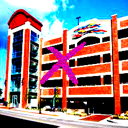

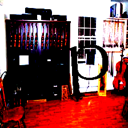

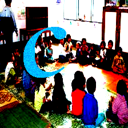

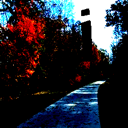

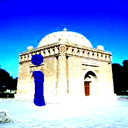

...

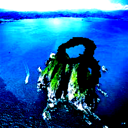

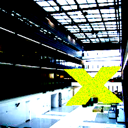

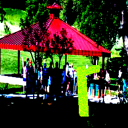

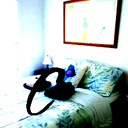

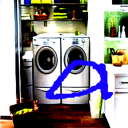

In [1]:
from data_classes import *


import torch

batch_size = 64

train_loader = torch.utils.data.DataLoader(
                        scene_letters_data(),
                        batch_size=batch_size, shuffle=True)

for batch_idx, (data,target) in enumerate(train_loader):

    break
    
    
import numpy as np
from PIL import Image, ImageOps

for i in range(batch_size):
    #print(data[i])
    img_array = np.transpose(np.clip(data[i].detach().numpy(),0,1),(1,2,0))*255
    #img_array =data[0].detach().numpy() * 255
    img_array = img_array.astype(np.uint8)

    #print(img_array)
    img = Image.fromarray(img_array)
    img = img.resize((128,128))

    display(img)